In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

['aptos2019-blindness-detection']


In [2]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import skimage.io
from skimage.transform import resize
from tqdm import tqdm
import PIL
from PIL import Image, ImageOps
import cv2
from sklearn.utils import class_weight, shuffle
from keras.losses import binary_crossentropy
from keras.applications.resnet50 import preprocess_input
import keras.backend as K
import tensorflow as tf
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

WORKERS = 2
CHANNEL = 3

import warnings
warnings.filterwarnings("ignore")
IMG_SIZE = 224
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = 1000 # use 1000 when you just want to explore new idea, use -1 for full train
# so 1000 is limiting training process to 1000 samples for computational efficiency

In [3]:
df_train = pd.read_csv('../input/aptos2019-blindness-detection/train.csv') # contains id_code, and diagnosis
df_test = pd.read_csv('../input/aptos2019-blindness-detection/test.csv') # only id_code

x = df_train['id_code']
y = df_train['diagnosis']

x, y = shuffle(x, y, random_state=SEED) # shuffling to tackle possible ordering in existing data

In [4]:
x.unique

<bound method Series.unique of 2462    aafe980edd0c
627     2c2aa057afc5
919     42a67337fa8e
2168    98e44127872f
814     3abac0961bfd
            ...     
1317    5b72ff04333d
2283    a07d9a5045cb
2004    8cb6b5b2f19c
607     2a8a9e957a6c
2775    bfda2fd0533a
Name: id_code, Length: 3662, dtype: object>

In [5]:
print(df_train.shape)
print(df_test.shape)
print(x[0])
print(y[0])

(3662, 2)
(1928, 1)
000c1434d8d7
2


3662 - each id is unique for train set

(3112,) (3112,) (550,) (550,)


<Axes: >

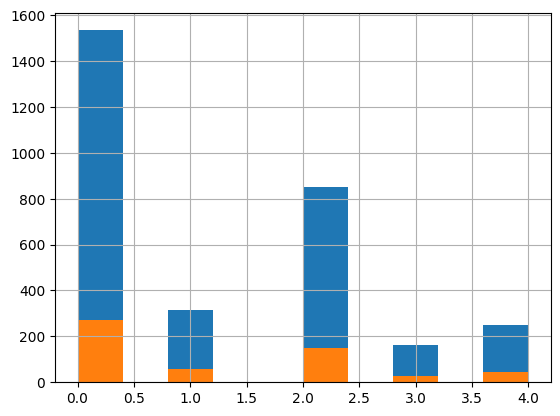

In [6]:
# df_train -> train and valid sets
# done to avoid using df_test until the very end for unbiased model performance
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15,
                                                      stratify=y, random_state=SEED) # stratify=y ensures proportional
# distribution in both train and valid sets
print(train_x.shape, train_y.shape, valid_x.shape, valid_y.shape)
train_y.hist()
valid_y.hist()

CPU times: user 3.92 s, sys: 275 ms, total: 4.19 s
Wall time: 4.36 s


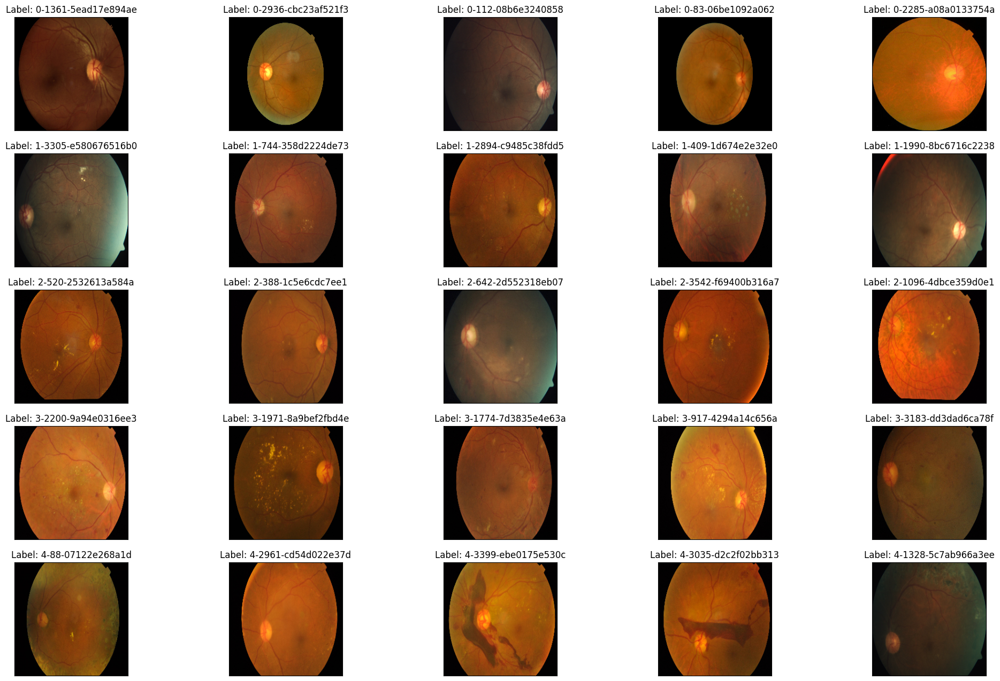

In [7]:
%%time
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for class_id in sorted(train_y.unique()): # class_id is the diagnosis categories 
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = cv2.imread(path) # reads image
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # converts from BGR to RGB
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE)) # resize image to 512

        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )
        

Observations: some pictures are very dark - (0,1), (0,1), (1,0), (4,5). Try grey pics

CPU times: user 3.64 s, sys: 183 ms, total: 3.82 s
Wall time: 3.66 s


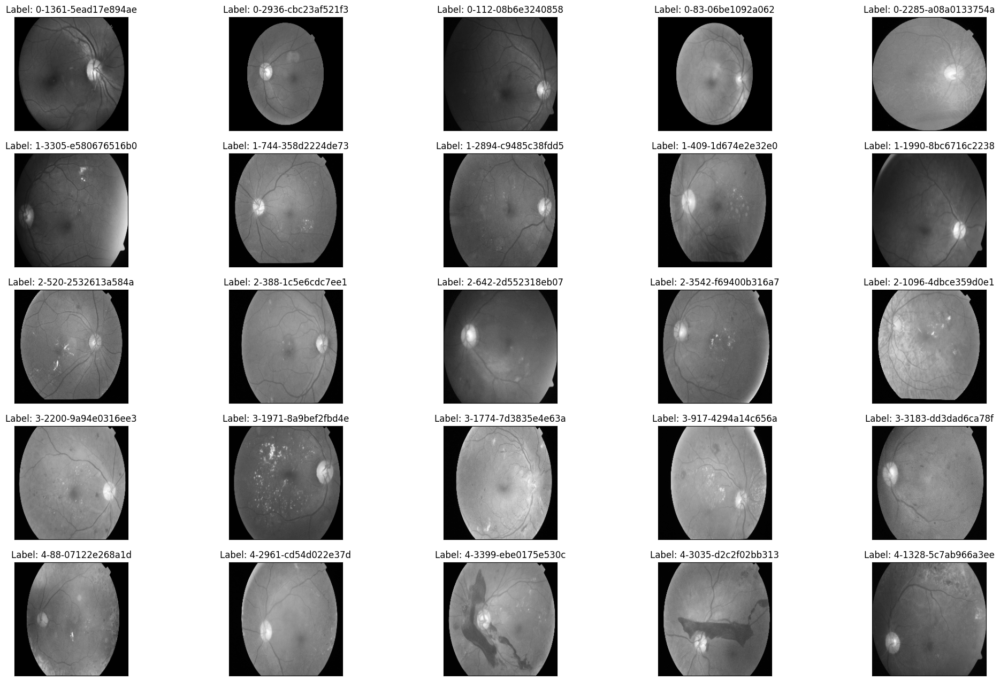

In [8]:
%%time
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#         image=cv2.addWeighted ( image, 0 , cv2.GaussianBlur( image , (0 ,0 ) , 10) ,-4 ,128)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

For severity 4, (4,1) and (4,5) are not obvious still that they are that severe. Zooming in addresses the issues better - IMG SIZE is important

2136 3216


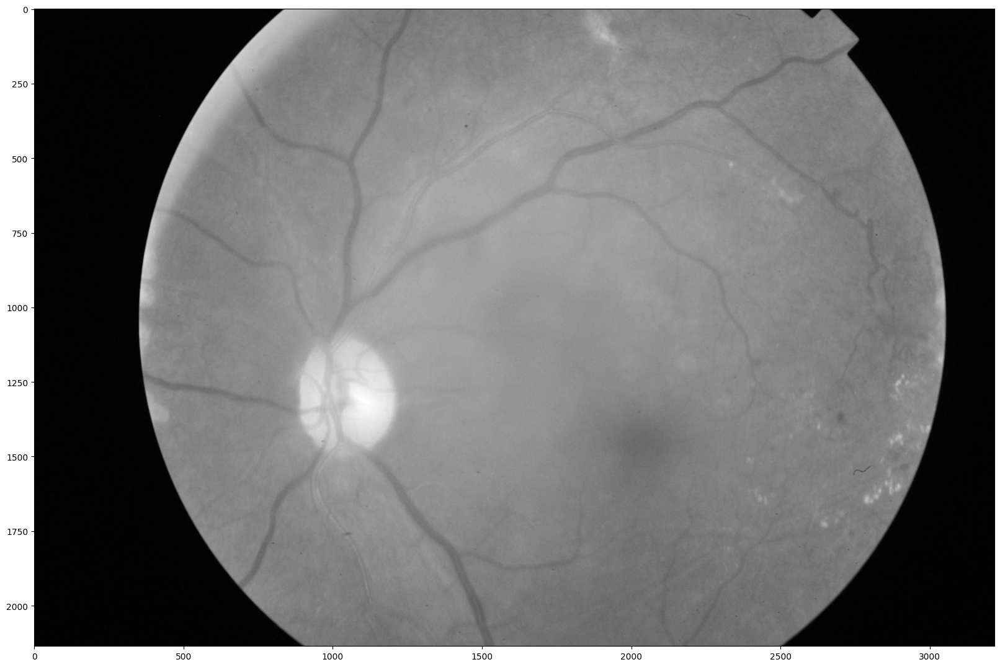

In [9]:
dpi = 80 #inch

# path=f"../input/aptos2019-blindness-detection/train_images/5c7ab966a3ee.png" # notice upper part
path=f"../input/aptos2019-blindness-detection/train_images/cd54d022e37d.png" # lower-right, this still looks not so severe, can be class3
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
height, width = image.shape
print(height, width)

SCALE=2
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

CPU times: user 6.24 s, sys: 257 ms, total: 6.49 s
Wall time: 4.41 s


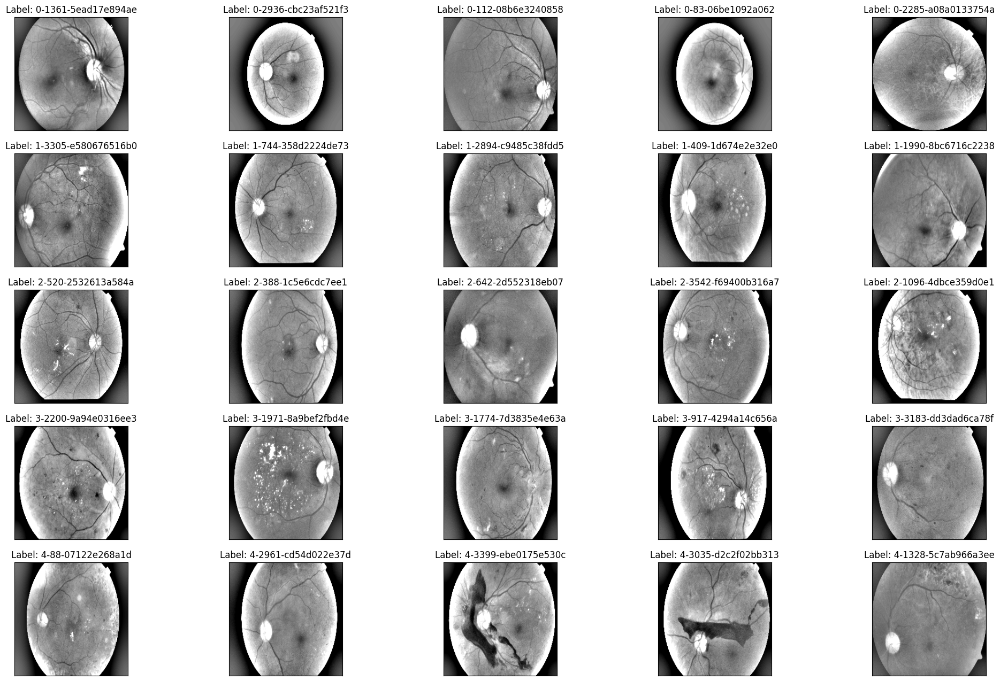

In [10]:
%%time
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # grey scale img
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) 
        # adds gaussian blur for smooth blurry version + combines original and blurry image with constant weight

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

Useless black edges around the scans, cropping is necessary 

In [11]:
def crop_image1(img,tol=7):
    # img is image data
    # tol  is tolerance
        
    mask = img>tol
    return img[np.ix_(mask.any(1),mask.any(0))]

def crop_image_from_gray(img,tol=7):
    if img.ndim ==2: # if img is greyscale
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
    #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
    #         print(img.shape)
        return img

In [12]:
def load_ben_color(path, sigmaX=10): # similar to the one above but handles colored imgs, also custom sigmaX + crop
    # sigmaX controls the amount of blur. higher sigmaX -> higher blur
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # from BGR to RGB
    image = crop_image_from_gray(image) # crop crop
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128) # famous weight
        
    return image

CPU times: user 18 s, sys: 488 ms, total: 18.5 s
Wall time: 11.3 s


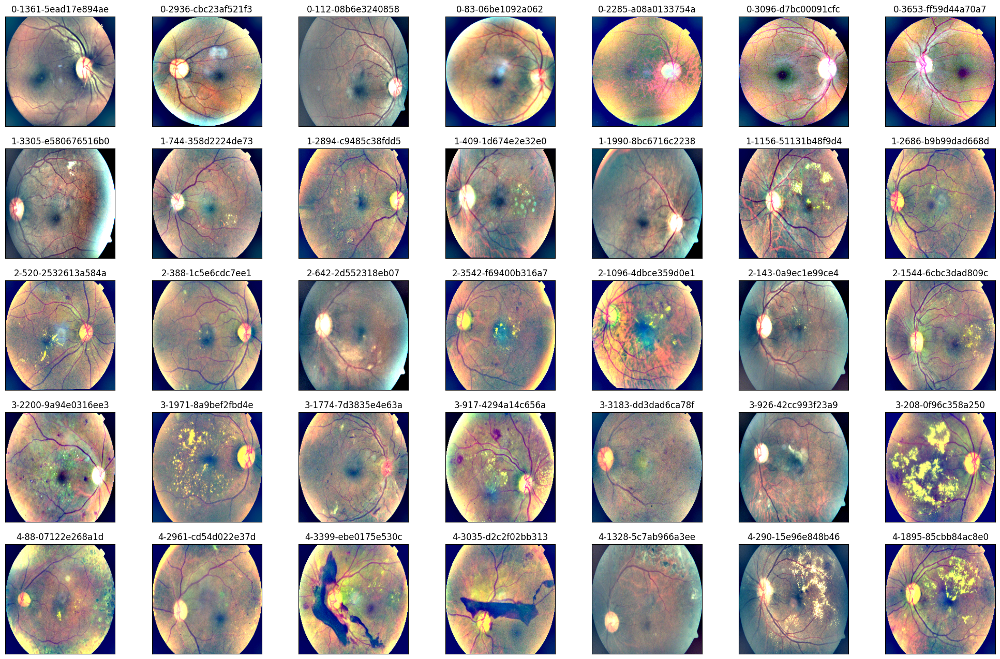

In [13]:
%%time

NUM_SAMP=7
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"../input/aptos2019-blindness-detection/train_images/{row['id_code']}.png"
        image = load_ben_color(path,sigmaX=30)

        plt.imshow(image)
        ax.set_title('%d-%d-%s' % (class_id, idx, row['id_code']) )

definitely better than the grey imgs from before

In [14]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
import numpy as np
from tqdm import tqdm  # Import tqdm for the progress bar

# Constants
#SAMPLE_SIZE = 1000 # test on 1000 sample first
BATCH_SIZE = 16
EPOCHS = 11
TRAIN_NUM = -1
# Sample 1000 random rows from df_train
#df_sampled = df_train.sample(SAMPLE_SIZE, random_state=SEED)

# Preprocess images and labels
def preprocess_data(df, image_dir):
    images = []
    labels = []
    
    # Wrap the loop with tqdm for a progress bar
    for _, row in tqdm(df.iterrows(), total=len(df), desc="Preprocessing Images"):
        path = f"{image_dir}/{row['id_code']}.png"
        image = load_ben_color(path, sigmaX=30)  # Use your custom preprocessing function
        image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))  # Resize image to IMG_SIZE x IMG_SIZE
        images.append(image)
        labels.append(row['diagnosis'])
    
    images = np.array(images) / 255.0  # Normalize images
    labels = np.array(labels)
    return images, labels

# Load and split data
image_dir = "../input/aptos2019-blindness-detection/train_images"

# Preprocess the 1000 sampled images
train_images, train_labels = preprocess_data(df_train, image_dir)

# Verify the shapes
print("Sampled Images Shape:", train_images.shape)
print("Sampled Labels Shape:", train_labels.shape)



Preprocessing Images: 100%|██████████| 3662/3662 [15:39<00:00,  3.90it/s]


Sampled Images Shape: (3662, 224, 224, 3)
Sampled Labels Shape: (3662,)


In [15]:
train_x, valid_x, train_y, valid_y = train_test_split(train_images, train_labels, test_size=0.15, stratify=train_labels, random_state=SEED)

# Define the MobileNetV2 model
base_model = MobileNetV2(input_shape=(IMG_SIZE, IMG_SIZE, 3), include_top=False, weights='imagenet')
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling layer
x = Dense(1024, activation='relu')(x)  # Fully connected layer
x = Dense(512, activation='relu')(x)  # Another fully connected layer
predictions = Dense(NUM_CLASSES, activation='softmax')(x)  # Output layer

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_x, train_y, 
                    validation_data=(valid_x, valid_y),
                    epochs=EPOCHS,
                    batch_size=BATCH_SIZE,
                    )

# Evaluate the model
loss, accuracy = model.evaluate(valid_x, valid_y)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/11


I0000 00:00:1731576823.405059      72 service.cc:145] XLA service 0x7bdbec092150 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731576823.405117      72 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


 12/195 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.4300 - loss: 1.4231

I0000 00:00:1731576828.034859      72 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


195/195 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - accuracy: 0.6784 - loss: 0.9122 - val_accuracy: 0.7327 - val_loss: 0.6522
Epoch 2/11
195/195 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.7745 - loss: 0.5780 - val_accuracy: 0.7818 - val_loss: 0.5820
Epoch 3/11
195/195 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.8227 - loss: 0.4927 - val_accuracy: 0.7818 - val_loss: 0.6063
Epoch 4/11
195/195 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.8368 - loss: 0.4273 - val_accuracy: 0.7964 - val_loss: 0.5594
Epoch 5/11
195/195 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.8674 - loss: 0.3702 - val_accuracy: 0.7927 - val_loss: 0.5654
Epoch 6/11
195/195 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.8899 - loss: 0.3120 - val_accuracy: 0.8091 - val_loss: 0.5562
Epoch 7/11
195/195 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.9070 - loss: 0.2735 - val_accuracy: 0.8236 - val_loss: 0.5545
Epoch 8/11
195/195 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.9197 - loss: 0.2244 - val_accuracy: 0.81

Final Training Loss: 0.12803877890110016
Final Training Accuracy: 0.9614396095275879
Final Validation Loss: 0.6693342328071594
Final Validation Accuracy: 0.7799999713897705


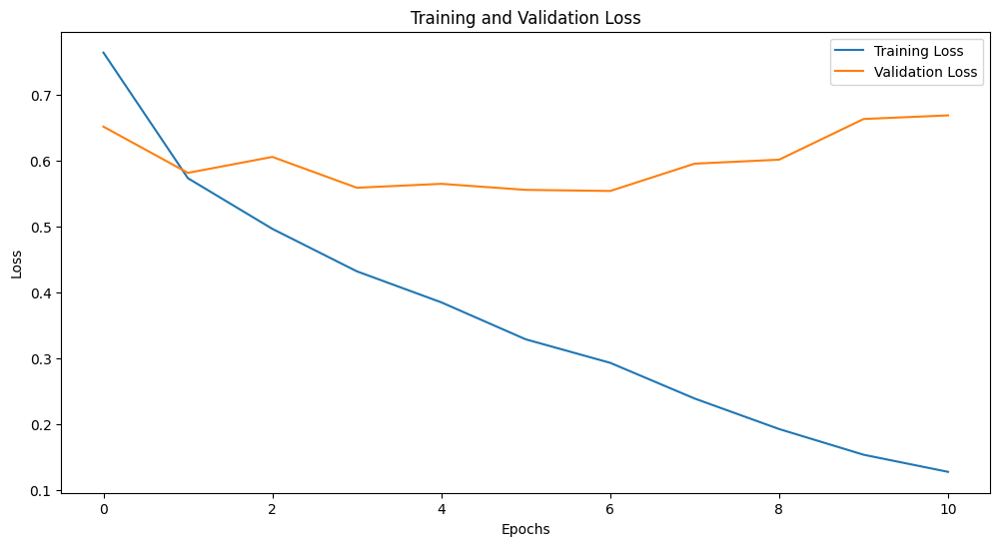

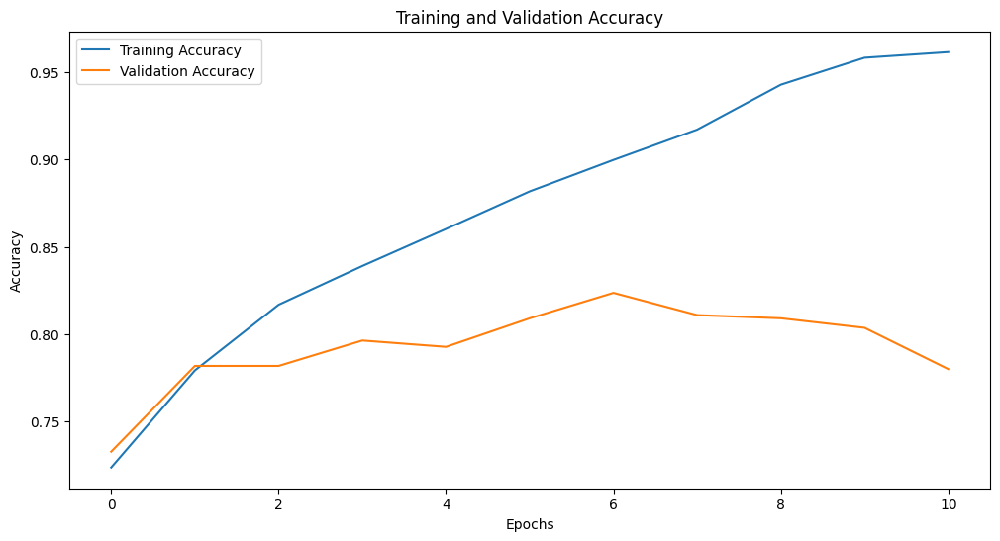

In [16]:
# Print final training and validation loss and accuracy
print("Final Training Loss:", history.history['loss'][-1])
print("Final Training Accuracy:", history.history['accuracy'][-1])
print("Final Validation Loss:", history.history['val_loss'][-1])
print("Final Validation Accuracy:", history.history['val_accuracy'][-1])

# Plot training and validation loss
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [17]:
from sklearn.metrics import classification_report

# Predict classes on validation data
y_pred = model.predict(valid_x)
y_pred_classes = np.argmax(y_pred, axis=1)

# Print classification report
print("Classification Report:")
print(classification_report(valid_y, y_pred_classes, target_names=[str(i) for i in range(NUM_CLASSES)]))


18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       271
           1       0.54      0.61      0.57        56
           2       0.72      0.67      0.70       150
           3       0.33      0.34      0.34        29
           4       0.46      0.36      0.41        44

    accuracy                           0.78       550
   macro avg       0.60      0.60      0.60       550
weighted avg       0.77      0.78      0.78       550



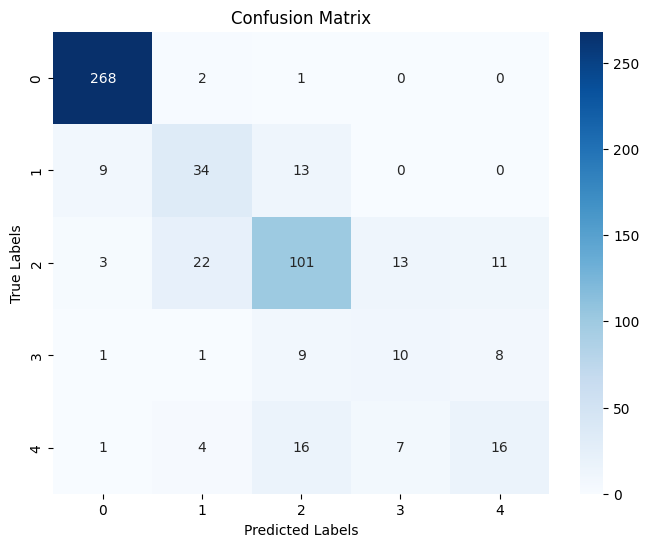

In [18]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(valid_y, y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[str(i) for i in range(NUM_CLASSES)], yticklabels=[str(i) for i in range(NUM_CLASSES)])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


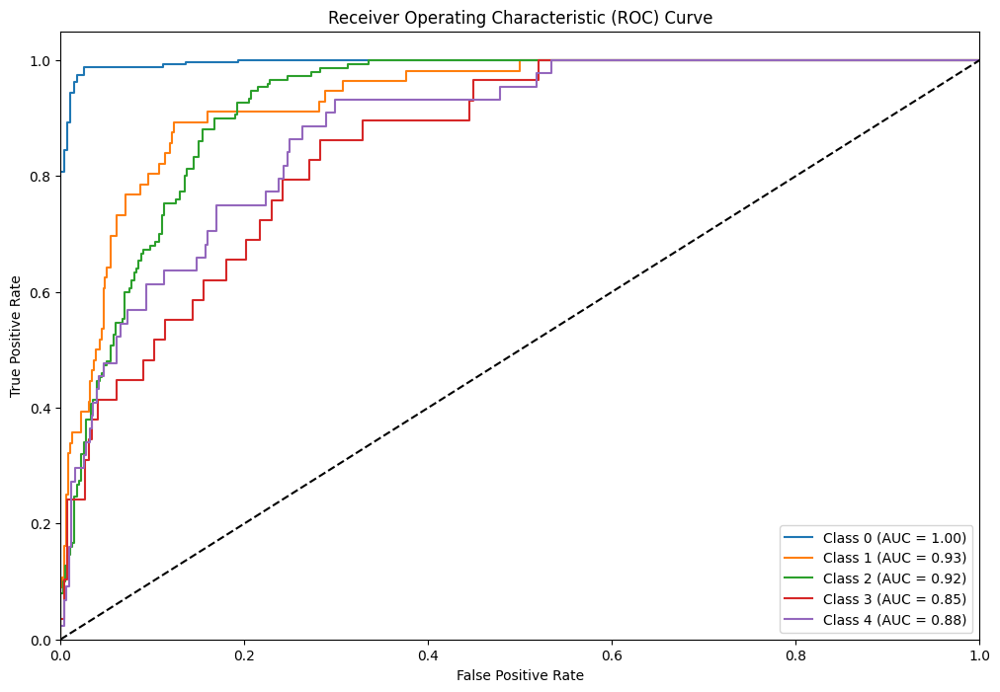

In [19]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the labels for multi-class ROC
valid_y_binarized = label_binarize(valid_y, classes=range(NUM_CLASSES))
y_pred_binarized = model.predict(valid_x)

# Plot ROC curve for each class
plt.figure(figsize=(12, 8))
for i in range(NUM_CLASSES):
    fpr, tpr, _ = roc_curve(valid_y_binarized[:, i], y_pred_binarized[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


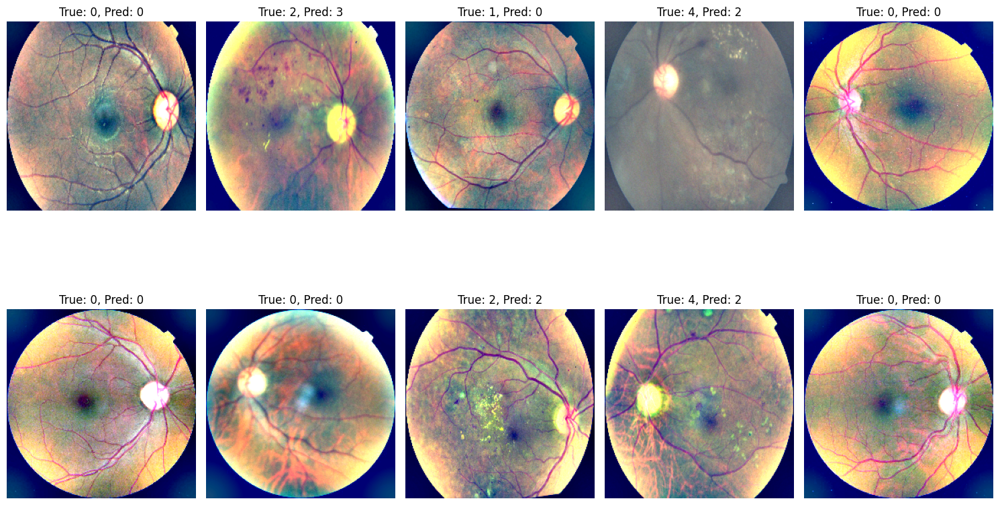

In [20]:
# Display sample predictions with true labels
import random

sample_indexes = random.sample(range(len(valid_x)), 10)  # Randomly pick 10 samples
plt.figure(figsize=(15, 10))

for i, idx in enumerate(sample_indexes):
    plt.subplot(2, 5, i + 1)
    plt.imshow(valid_x[idx])
    plt.title(f"True: {valid_y[idx]}, Pred: {y_pred_classes[idx]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


now for test and submission

In [21]:
# Load test data
test_df = pd.read_csv("../input/aptos2019-blindness-detection/test.csv")

# Preprocess test images (no labels in test set)
def preprocess_test_images(df, image_dir):
    images = []
    ids = []
    for _, row in tqdm(df.iterrows(), total=len(df), desc="Preprocessing Test Images"):
        path = f"{image_dir}/{row['id_code']}.png"
        image = load_ben_color(path, sigmaX=30)  # Apply your custom preprocessing
        image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))  # Resize to IMG_SIZE x IMG_SIZE
        images.append(image)
        ids.append(row['id_code'])
    images = np.array(images) / 255.0  # Normalize images
    return images, ids

# Directory for test images
test_image_dir = "../input/aptos2019-blindness-detection/test_images"

# Preprocess the test images
test_images, test_ids = preprocess_test_images(test_df, test_image_dir)


Preprocessing Test Images: 100%|██████████| 1928/1928 [04:49<00:00,  6.67it/s]


In [22]:
# Make predictions on the test set
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)  # Get the predicted class for each test image

61/61 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step


In [23]:
# Create a submission DataFrame
submission_df = pd.DataFrame({
    'id_code': test_ids,
    'diagnosis': predicted_classes
})

# Save the submission file
submission_df.to_csv("submission.csv", index=False)
print("Submission file created: submission.csv")


Submission file created: submission.csv
